# 2. 카메라 스티커앱 만들기 첫걸음 [프로젝트]

### **평가 기준**
1. 자기만의 카메라앱 기능 구현을 완수하였다.\
얼굴 영역과 랜드마크를 정확하게 검출하고, 스티커 사진을 합성시키는 데 성공하였다.
2. 스티커 이미지를 정확한 원본 위치에 반영하였다.	\
정확한 좌표계산을 통해 고양이 수염의 위치가 원본 얼굴에 잘 어울리게 출력되었다.
3. 카메라 스티커앱을 다양한 원본이미지에 적용했을 때의 문제점을 체계적으로 분석하였다.	\
얼굴각도, 이미지 밝기, 촬영거리 등 다양한 변수에 따른 영향도를 보고서에 체계적으로 분석하였다.

## 2-1. 프로젝트: 고양이 수염 스티커 만들기
### step 1. 스티커 구하기 or 만들기
### step 2. 얼굴 검출 & 랜드마크 검출 하기

In [1]:
# 필요한 패키지 import 하기
import os # 환경 변수나 디렉터리, 파일 등의 OS 자원을 제어할 수 있게 해주는 모듈
import cv2 # OpenCV라이브러리 → 컴퓨터 비전 관련 프로그래밍을 쉽게 할 수 있도록 도와주는 라이브러리
import matplotlib.pyplot as plt # 다양한 데이터를 많은 방법으로 도식화 할 수 있도록 하는 라이브러리
import numpy as np # 다차원 배열을 쉽게 처리하고 효율적으로 사용할 수 있도록 하는 라이브러리
import dlib # 이미지 처리 및 기계 학습, 얼굴인식 등을 할 수 있는 c++ 로 개발된 고성능의 라이브러리 

In [2]:
# 현재 경로 확인
print(os.getcwd())

/aiffel/aiffel/camera_sticker


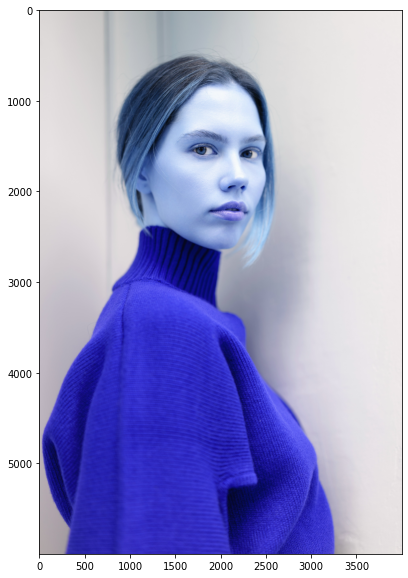

In [3]:
my_image_path = 'images/img_gc.png' # 본인 이미지가 있는 경로를 가지고 온다.
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
plt.figure(figsize=(15,10))
plt.imshow(img_bgr) # 이미지를 출력하기 위해 출력할 이미지를 올려준다. (실제 출력은 하지 않음)
plt.show() # 이미지를 출력해준다. (실제 출력)

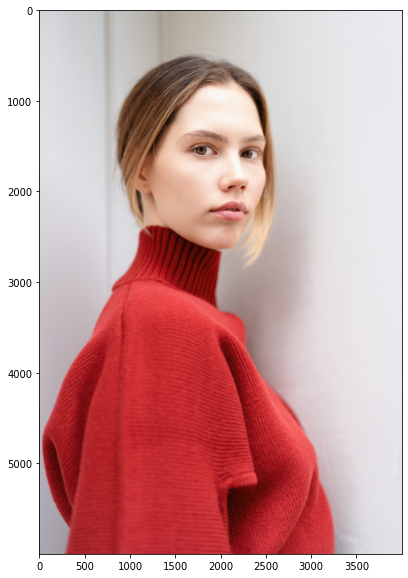

In [4]:
# plt.imshow 이전에 RGB 이미지로 바꾸는 것을 잊지마세요. 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,10))
plt.imshow(img_rgb) # 이미지 실제 출력하기 위해 이미지를 올려줌 (원하는 사이즈의 픽셀을 원하는 색으로 채워서 만든 그림이라고 합니다.)
plt.show() # 이미지 실제 출력

In [5]:
# detector를 선언합니다
detector_hog = dlib.get_frontal_face_detector() # 기본 얼굴 감지기를 반환

In [6]:
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)

rectangles[[(1349, 1043) (2730, 2423)], [(2224, 3924) (2268, 3967)], [(2152, 3852) (2196, 3895)]]


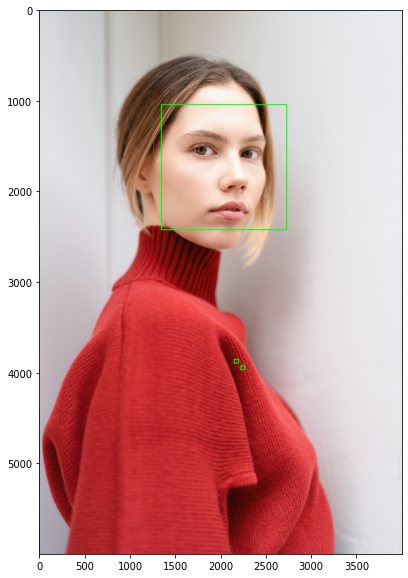

In [7]:
# 찾은 얼굴 영역 박스 리스트
# 여러 얼굴이 있을 수 있습니다
print(dlib_rects)   

for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽

    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 10, lineType=cv2.LINE_AA) # 시작점의 좌표와 종료점 좌표로 직각 사각형을 그림

img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,10))
plt.imshow(img_show_rgb)
plt.show()

이미지를 보니 첫 배열에 들어가있는 좌표가 얼굴이다.

얼굴 좌표 : (1349, 1043) (2730, 2423)

### 얼굴 랜드마크

In [8]:
model_path = 'models/shape_predictor_68_face_landmarks.dat'
    # 저장한 landmark 모델의 주소를 model_path 변수에 저장
landmark_predictor = dlib.shape_predictor(model_path)
    # dlib 라이브러리의 shape_predictor 함수를 이용하여 모델을 불러옴
    # landmark_predictor는 RGB이미지와 dlib.rectangle를 입력 받고 dlib.full_object_detection를 반환
    # dlib.rectangle: 내부를 예측하는 박스
    # dlib.full_object_detection: 각 구성 요소의 위치와, 이미지 상의 객체의 위치를 나타냄

In [9]:
list_landmarks = [] # 랜드마크의 위치를 저장할 list 생성    

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
# face landmark 좌표를 저장해둡니다
#for dlib_rect in dlib_rects:
points = landmark_predictor(img_rgb, dlib_rects[0]) # landmark의 위치정보를 points 변수에 저장
list_points = list(map(lambda p: (p.x, p.y), points.parts())) # 각각의 landmark 위치정보를 (x,y) 형태로 변환하여 list_points 리스트로 저장
list_landmarks.append(list_points) # list_landmarks에 랜드마크 리스트를 저장

print(len(list_landmarks[0]))
    # 얼굴이 n개인 경우 list_landmarks는 n개의 원소를 갖고
    # 각 원소는 68개의 랜드마크 위치가 나열된 list 
    # list_landmarks의 원소가 1개이므로 list_landmarks[1]을 호출하면 IndexError가 발생

68


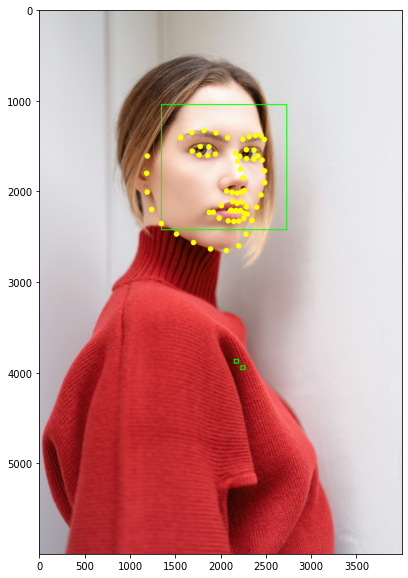

In [10]:
# list_landmarks의 원소가 1개이므로 아래 반복문은 한번만 실행됨
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 30, (0, 255, 255), -1)
            # cv2.circle: OpenCV의 원을 그리는 함수
            # img_show 이미지 위 각각의 point에
            # 크기가 30이고 (0, 255, 255)색으로 내부가 채워진(-1) 원을 그림
            # (마지막 인수가 자연수라면 그만큼의 두께의 선으로 원이 그려짐)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)    # RGB 이미지로 전환
plt.figure(figsize=(15,10))
plt.imshow(img_show_rgb)
plt.show()

### Step 3. 스티커 적용 위치 확인하기

In [11]:
# zip() : 두 그룹의 데이터를 서로 엮어주는 파이썬의 내장 함수
# dlib_rects와 list_landmarks 데이터를 엮어 주었음
# dlib_rects : 얼굴 영역을 저장하고 있는 값
# → rectangles[[(1349, 1043), (2730, 2423)]]
# list_landmarks : 68개의 랜드마크 값 저장(이목구비 위치(x,y))

for dlib_rect, landmark in zip(dlib_rects, list_landmarks): # 얼굴 영역을 저장하고 있는 값과 68개의 랜드마크를 저장하고 있는 값으로 반복문 실행
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0] # 이미지에서 코 부위의 x값
    y = landmark[30][1] - dlib_rect.height()//2 # 이미지에서 코 부위의 y값 - 얼굴 영역의 세로를 차지하는 픽셀의 수//
    w = h = dlib_rect.width() # 얼굴 영역의 가로를 차지하는 픽셀의 수 (531-345+1) → max(x) - min(x) +1(픽셀의 수 이기 때문에 1을 더해줌 → 픽셀 수는 점 하나로도 1이 됨)
    print (f'(x,y) : ({x},{y})')
    print (f'(w,h) : ({w},{h})')

(2248, 1850)
(x,y) : (2248,1160)
(w,h) : (1382,1382)


### Step 4. 스티커 적용하기

In [12]:
sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'  # 고양이 수염 이미지의 경로
img_sticker = cv2.imread(sticker_path, cv2.IMREAD_UNCHANGED)  # 알파 채널을 포함하여 이미지를 읽어옵니다
print(img_sticker.shape)  # 알파 채널을 포함한 고양이 수염 이미지의 차원 확인

# 이미지 크기 조정
img_sticker = cv2.resize(img_sticker, (w, h))
print(img_sticker.shape)

(512, 512, 4)
(1382, 1382, 4)


In [13]:
# x,y,w,h 모두 위에서 반복문 안에서 지정해준 값임
# x는 이미지에서 코 부위의 x값 = 2248
# y는 이미지에서 코 부위의 y값 = 1850
# w는 얼굴 영역의 가로를 차지하는 픽셀의 수 = 1382
# h는 얼굴 영역의 가로를 차지하는 픽셀의 수 = 1382
refined_x = x - w // 2
refined_y = y + w // 20
# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정합니다. 이미지 시작점은 top-left 좌표이기 때문입니다.
# 즉, refined_x, refined_y값에서 고양이 수염 이미지가 시작됨

print (f'(x,y) : ({refined_x},{refined_y})')

(x,y) : (1557,1229)


In [14]:
# 이미지가 이미지 밖에서 시작하지 않도록 조정이 필요함
# 좌표 순서가 y,x임에 유의한다. (y,x,rgb channel)
# 현재 상황에서는 -y 크기만큼 스티커를 crop 하고, top 의 x좌표와 y 좌표를 각각의 경우에 맞춰 원본 이미지의 경계 값으로 수정하면 아래와 같은 형식으로 나옵니다.
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :] # refined_y가 -98이므로, img_sticker[98: , :]가 된다. (187, 187, 3)에서 (89, 187, 3)이 됨 (187개 중에서 98개가 잘려나감)
    refined_y = 0
    
print (f'(x,y) : ({refined_x},{refined_y})')

(x,y) : (1557,1229)


In [15]:
# img_show의 스티커를 붙일 영역
sticker_area = img_show[refined_y:refined_y + img_sticker.shape[0], refined_x:refined_x + img_sticker.shape[1]]
'''
# 왕관 이미지에서 사용할 부분은 0이 아닌 색이 있는 부분을 사용합니다.
# 왕관 이미지에서 0이 나오는 부분은 흰색이라는 뜻, 즉 이미지가 없다는 소리임.
# 현재 왕관 이미지에서는 왕관과 받침대 밑의 ------ 부분이 됨
# 그렇기 때문에 0인 부분(이미지가 없는 부분)은 제외하고 적용
# sticker_area는 원본 이미지에서 스티커를 적용할 위치를 미리 잘라낸 이미지입니다.
# 즉, 왕관 이미지에서 왕관 이미지가 없는 부분(왕관과 받침대 밑의 ------ 부분)은 원본 이미지에서 미리 잘라놓은 sticker_area(스티커 적용할 부분 만큼 원본 이미지에서 자른 이미지)를 적용하고,
# 나머지 부분은 스티커로 채워주면 됨
# np.where는 조건에 해당하는 인덱스만 찾아서 값을 적용하는 방법이다.
# 아래 코드에서는 img_sticker가 0일 경우(왕관 이미지에서 왕관 부분 제외한 나머지 이미지)에는 sticker_area(원본 이미지에서 스티커를 적용할 위치를 미리 잘라낸 이미지)를 적용하고,
# 나머지 부분은 img_sticker(왕관 이미지)를 적용한다.
img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==0,sticker_area,img_sticker).astype(np.uint8)
'''

'\n# 왕관 이미지에서 사용할 부분은 0이 아닌 색이 있는 부분을 사용합니다.\n# 왕관 이미지에서 0이 나오는 부분은 흰색이라는 뜻, 즉 이미지가 없다는 소리임.\n# 현재 왕관 이미지에서는 왕관과 받침대 밑의 ------ 부분이 됨\n# 그렇기 때문에 0인 부분(이미지가 없는 부분)은 제외하고 적용\n# sticker_area는 원본 이미지에서 스티커를 적용할 위치를 미리 잘라낸 이미지입니다.\n# 즉, 왕관 이미지에서 왕관 이미지가 없는 부분(왕관과 받침대 밑의 ------ 부분)은 원본 이미지에서 미리 잘라놓은 sticker_area(스티커 적용할 부분 만큼 원본 이미지에서 자른 이미지)를 적용하고,\n# 나머지 부분은 스티커로 채워주면 됨\n# np.where는 조건에 해당하는 인덱스만 찾아서 값을 적용하는 방법이다.\n# 아래 코드에서는 img_sticker가 0일 경우(왕관 이미지에서 왕관 부분 제외한 나머지 이미지)에는 sticker_area(원본 이미지에서 스티커를 적용할 위치를 미리 잘라낸 이미지)를 적용하고,\n# 나머지 부분은 img_sticker(왕관 이미지)를 적용한다.\nimg_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] =     np.where(img_sticker==0,sticker_area,img_sticker).astype(np.uint8)\n'

In [16]:
# 알파 채널을 사용해 하얀색 배경을 제거하고 투명한 배경을 유지합니다
if img_sticker.shape[2] == 4:  # 알파 채널이 있는 경우
    # 알파 채널을 0~1로 정규화
    alpha_channel = img_sticker[:, :, 3] / 255.0  # 알파 채널
    sticker_area_rgb = img_sticker[:, :, :3]  # RGB 채널
    
    # 하얀색 배경을 찾아서 알파 채널을 0으로 만듬
    white_pixels = np.all(sticker_area_rgb == [255, 255, 255], axis=-1)  # 하얀색 픽셀 찾기
    alpha_channel[white_pixels] = 0  # 하얀색 부분은 투명하게 만듬

    # img_show에 스티커를 합성
    for c in range(3):  # 각 채널에 대해
        img_show[refined_y:refined_y + img_sticker.shape[0], refined_x:refined_x + img_sticker.shape[1], c] = \
            (alpha_channel * sticker_area_rgb[:, :, c] + (1 - alpha_channel) * sticker_area[:, :, c]).astype(np.uint8)

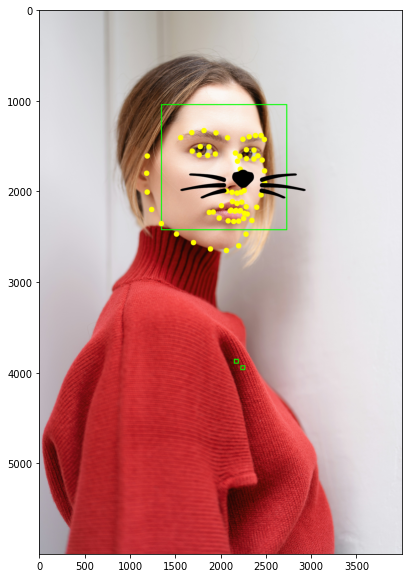

In [17]:
# 고양이 수염 이미지를 적용한 이미지를 보여준다.
# 얼굴 영역(7-3)과 랜드마크(7-4)를 미리 적용해놓은 img_show에 고양이 수염 이미지를 덧붙인 이미지가 나오게 된다.
plt.figure(figsize=(15,10))
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

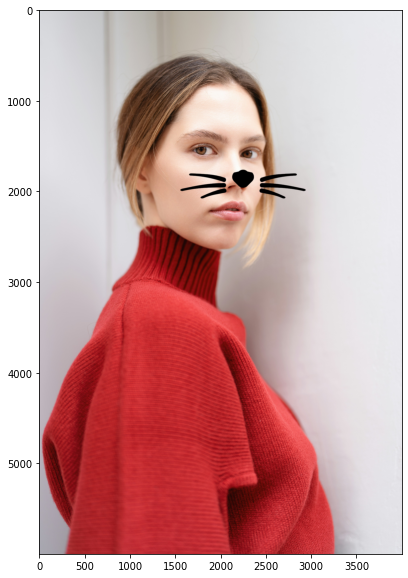

In [18]:
# img_bgr는 RGB로만 적용해놓은 원본 이미지
# refined_x, refined_y는 스티커 이미지가 붙을 위치를 나타냄

# img_bgr의 스티커를 적용할 위치를 자른 영역
sticker_area = img_bgr[refined_y:refined_y + img_sticker.shape[0], refined_x:refined_x + img_sticker.shape[1]]

# 알파 채널을 사용해 하얀 배경을 제거하고 투명한 배경을 유지합니다
if img_sticker.shape[2] == 4:  # 알파 채널이 있는 경우
    # 알파 채널을 0~1로 정규화
    alpha_channel = img_sticker[:, :, 3] / 255.0  # 알파 채널
    sticker_area_rgb = img_sticker[:, :, :3]  # RGB 채널
    
    # 하얀색 배경을 찾아서 알파 채널을 0으로 만듬
    white_pixels = np.all(sticker_area_rgb == [255, 255, 255], axis=-1)  # 하얀색 픽셀 찾기
    alpha_channel[white_pixels] = 0  # 하얀색 부분은 투명하게 만듬

    # img_bgr에 스티커를 합성
    for c in range(3):  # 각 채널에 대해
        img_bgr[refined_y:refined_y + img_sticker.shape[0], refined_x:refined_x + img_sticker.shape[1], c] = \
            (alpha_channel * sticker_area_rgb[:, :, c] + (1 - alpha_channel) * sticker_area[:, :, c]).astype(np.uint8)

# 스티커를 적용한 이미지를 보여줍니다.
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))  # RGB만 적용한 원본 이미지에 스티커 이미지를 덧붙인 결과를 보여줌
plt.show()

### Step 5. 문제점 찾아보기
**(1) 다양한 각도 사진**
**(2) 문제점 자세하게 기록 - 해결책 찾기**


생각할 수 있는 문제점
1. 얼굴 각도에 따른 스티커 변화
2. 멀리서 촬영, 옆으로 누워서 촬영
3. 실행 속도
4. 스티커앱 정확도

### 1. 얼굴 각도에 따른 스티커 변화

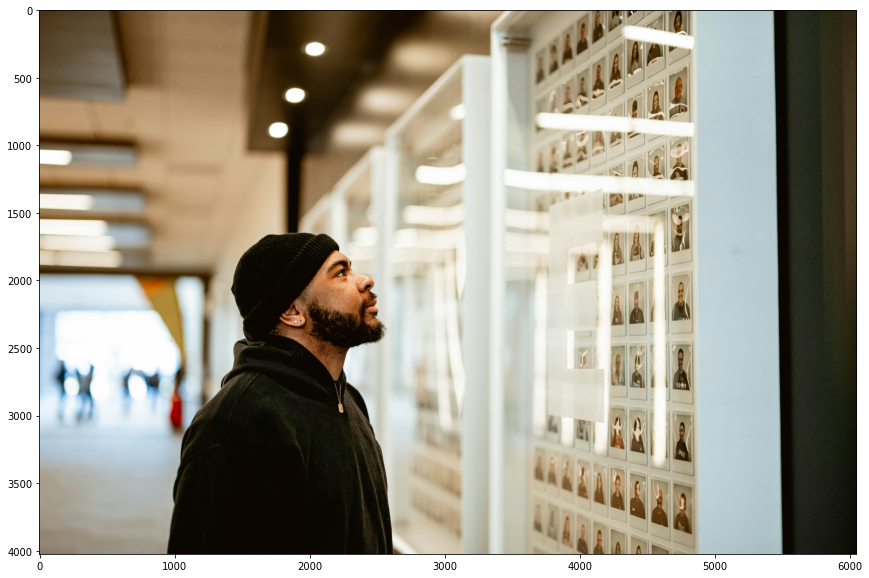

In [41]:
my_image_path = 'images/img_side.png' # 본인 이미지가 있는 경로를 가지고 온다.
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,10))
plt.imshow(img_rgb) # 이미지 실제 출력하기 위해 이미지를 올려줌 (원하는 사이즈의 픽셀을 원하는 색으로 채워서 만든 그림이라고 합니다.)
plt.show() # 이미지 실제 출력

rectangles[]


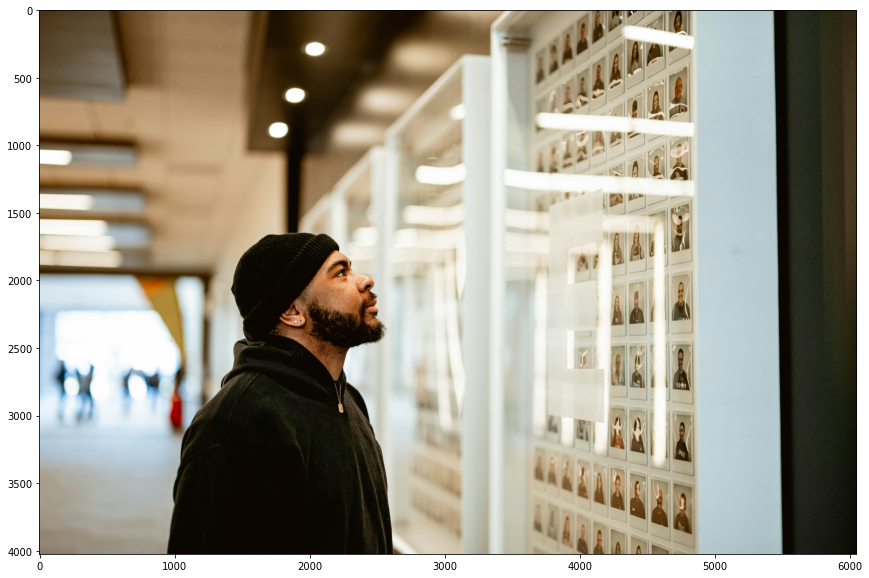

In [42]:
detector_hog = dlib.get_frontal_face_detector() # 기본 얼굴 감지기를 반환

img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)  

print(dlib_rects)

for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽

    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 10, lineType=cv2.LINE_AA) # 시작점의 좌표와 종료점 좌표로 직각 사각형을 그림

img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,10))
plt.imshow(img_show_rgb)
plt.show()

완벽하게 옆으로 돌고 있는 상태의 사진은 얼굴이 인식되지 않는다.

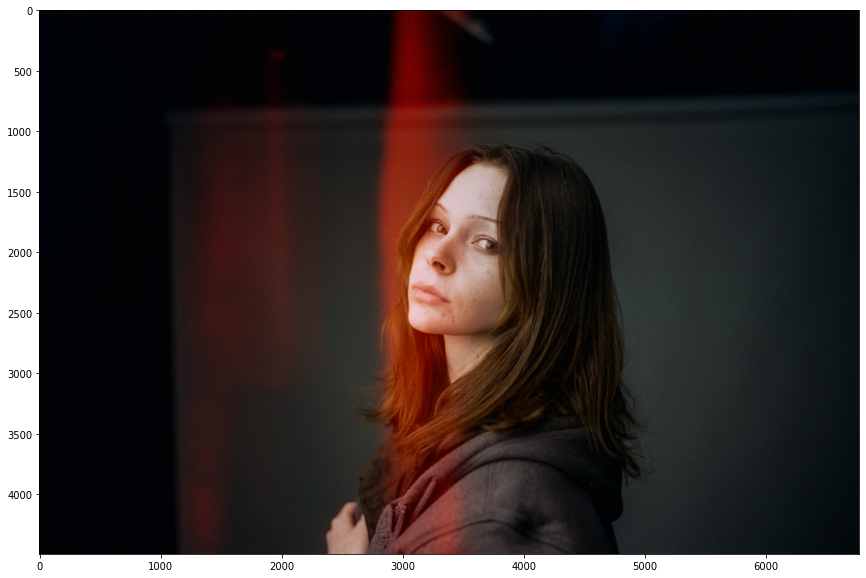

In [19]:
my_image_path = 'images/img_angle.png' # 본인 이미지가 있는 경로를 가지고 온다.
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,10))
plt.imshow(img_rgb) # 이미지 실제 출력하기 위해 이미지를 올려줌 (원하는 사이즈의 픽셀을 원하는 색으로 채워서 만든 그림이라고 합니다.)
plt.show() # 이미지 실제 출력

rectangles[[(2785, 1508) (3936, 2658)]]


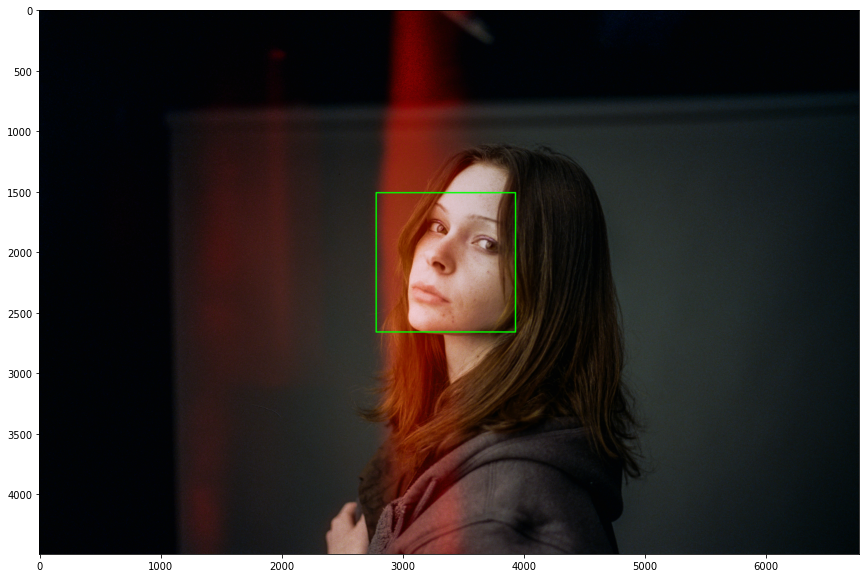

In [20]:
detector_hog = dlib.get_frontal_face_detector() # 기본 얼굴 감지기를 반환

img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)  

print(dlib_rects)

for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽

    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 10, lineType=cv2.LINE_AA) # 시작점의 좌표와 종료점 좌표로 직각 사각형을 그림

img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,10))
plt.imshow(img_show_rgb)
plt.show()

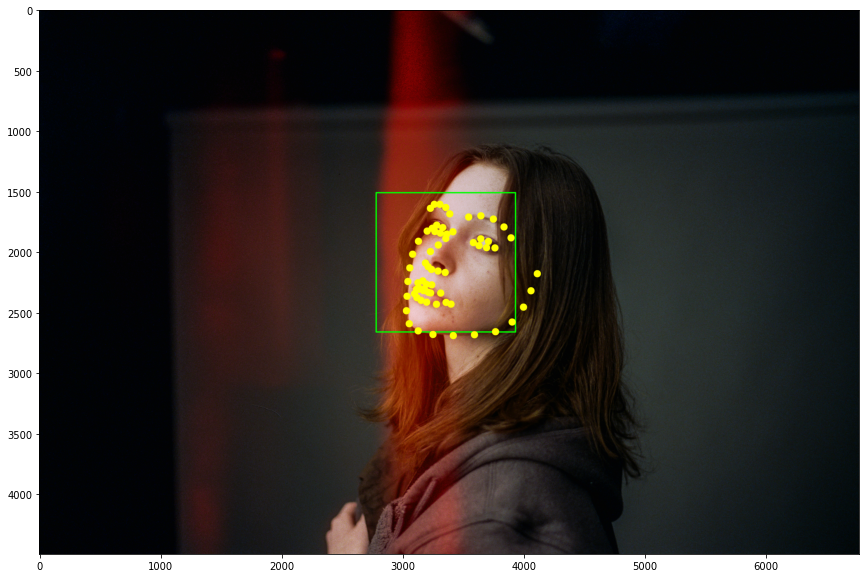

In [21]:
list_landmarks = [] # 랜드마크의 위치를 저장할 list 생성    

#for dlib_rect in dlib_rects:
points = landmark_predictor(img_rgb, dlib_rects[0]) # landmark의 위치정보를 points 변수에 저장
list_points = list(map(lambda p: (p.x, p.y), points.parts())) # 각각의 landmark 위치정보를 (x,y) 형태로 변환하여 list_points 리스트로 저장
list_landmarks.append(list_points) # list_landmarks에 랜드마크 리스트를 저장

for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 30, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)    # RGB 이미지로 전환
plt.figure(figsize=(15,10))
plt.imshow(img_show_rgb)
plt.show()

(3233, 1994)
(x,y) : (3233,1419)
(w,h) : (1152,1152)
(512, 512, 4)
(1152, 1152, 4)
(x,y) : (2657,1476)


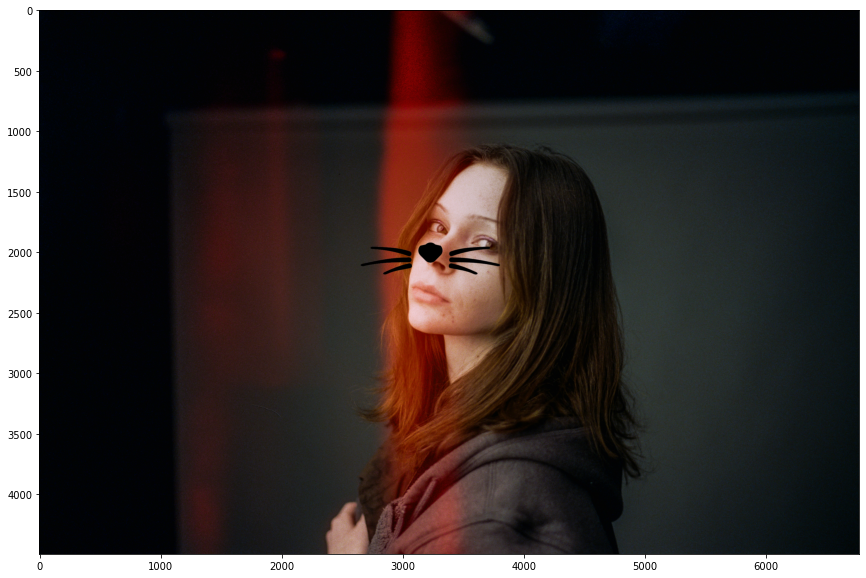

In [22]:
for dlib_rect, landmark in zip(dlib_rects, list_landmarks): # 얼굴 영역을 저장하고 있는 값과 68개의 랜드마크를 저장하고 있는 값으로 반복문 실행
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0] # 이미지에서 코 부위의 x값
    y = landmark[30][1] - dlib_rect.height()//2 # 이미지에서 코 부위의 y값 - 얼굴 영역의 세로를 차지하는 픽셀의 수//
    w = h = dlib_rect.width() # 얼굴 영역의 가로를 차지하는 픽셀의 수 (531-345+1) → max(x) - min(x) +1(픽셀의 수 이기 때문에 1을 더해줌 → 픽셀 수는 점 하나로도 1이 됨)
    print (f'(x,y) : ({x},{y})')
    print (f'(w,h) : ({w},{h})')

sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'  # 고양이 수염 이미지의 경로
img_sticker = cv2.imread(sticker_path, cv2.IMREAD_UNCHANGED)  # 알파 채널을 포함하여 이미지를 읽어옵니다
print(img_sticker.shape)  # 알파 채널을 포함한 고양이 수염 이미지의 차원 확인

# 이미지 크기 조정
img_sticker = cv2.resize(img_sticker, (w, h))
print(img_sticker.shape)

refined_x = x - w // 2
refined_y = y + w // 20

print (f'(x,y) : ({refined_x},{refined_y})')

sticker_area = img_bgr[refined_y:refined_y + img_sticker.shape[0], refined_x:refined_x + img_sticker.shape[1]]

# 알파 채널을 사용해 하얀 배경을 제거하고 투명한 배경을 유지합니다
if img_sticker.shape[2] == 4:  # 알파 채널이 있는 경우
    # 알파 채널을 0~1로 정규화
    alpha_channel = img_sticker[:, :, 3] / 255.0  # 알파 채널
    sticker_area_rgb = img_sticker[:, :, :3]  # RGB 채널
    
    # 하얀색 배경을 찾아서 알파 채널을 0으로 만듬
    white_pixels = np.all(sticker_area_rgb == [255, 255, 255], axis=-1)  # 하얀색 픽셀 찾기
    alpha_channel[white_pixels] = 0  # 하얀색 부분은 투명하게 만듬

    # img_bgr에 스티커를 합성
    for c in range(3):  # 각 채널에 대해
        img_bgr[refined_y:refined_y + img_sticker.shape[0], refined_x:refined_x + img_sticker.shape[1], c] = \
            (alpha_channel * sticker_area_rgb[:, :, c] + (1 - alpha_channel) * sticker_area[:, :, c]).astype(np.uint8)

# 스티커를 적용한 이미지를 보여줍니다.
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))  # RGB만 적용한 원본 이미지에 스티커 이미지를 덧붙인 결과를 보여줌
plt.show()

살짝 비스듬하게 들고 있는 얼굴 각도로 봤을 때 이목구비가 확실하게 다 보여서 그런지 얼굴 감지는 제대로 됐다.

하지만 각도에 대해 별도의 처리를 하지 않았기 때문에 얼굴 각도를 반영해서 스티커가 회전하지 않아 어색해보인다.

### 2. 멀리서 촬영, 옆으로 누워서 촬영

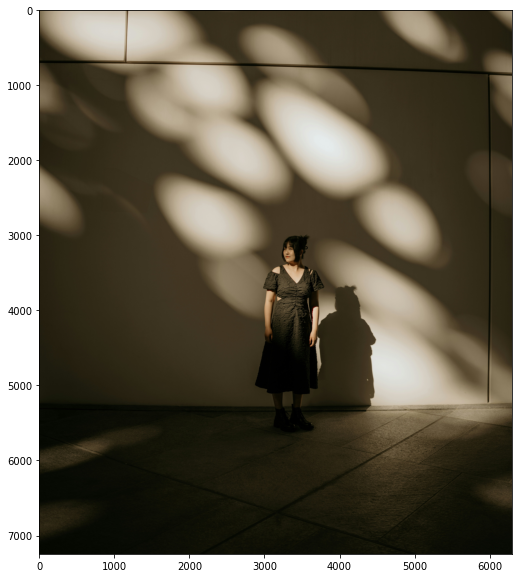

In [23]:
my_image_path = 'images/img_far.png' # 본인 이미지가 있는 경로를 가지고 온다.
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,10))
plt.imshow(img_rgb) # 이미지 실제 출력하기 위해 이미지를 올려줌 (원하는 사이즈의 픽셀을 원하는 색으로 채워서 만든 그림이라고 합니다.)
plt.show() # 이미지 실제 출력

rectangles[[(3214, 3132) (3400, 3318)]]


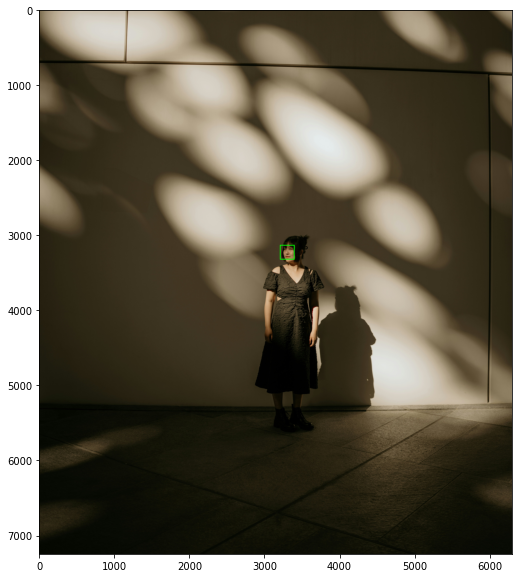

In [24]:
detector_hog = dlib.get_frontal_face_detector() # 기본 얼굴 감지기를 반환

img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)  

print(dlib_rects)

for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽

    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 10, lineType=cv2.LINE_AA) # 시작점의 좌표와 종료점 좌표로 직각 사각형을 그림

img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,10))
plt.imshow(img_show_rgb)
plt.show()

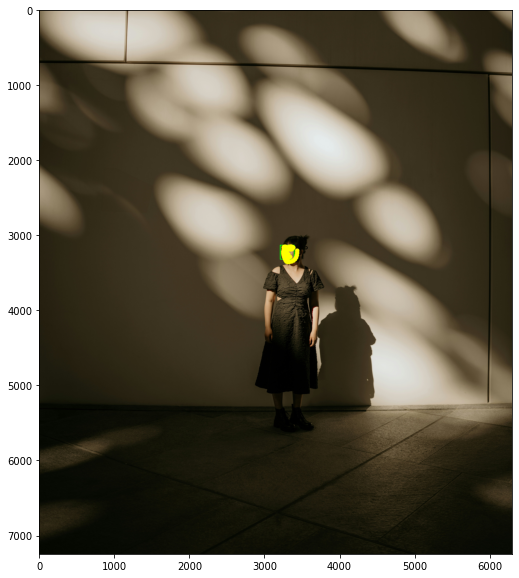

In [25]:
list_landmarks = [] # 랜드마크의 위치를 저장할 list 생성    

#for dlib_rect in dlib_rects:
points = landmark_predictor(img_rgb, dlib_rects[0]) # landmark의 위치정보를 points 변수에 저장
list_points = list(map(lambda p: (p.x, p.y), points.parts())) # 각각의 landmark 위치정보를 (x,y) 형태로 변환하여 list_points 리스트로 저장
list_landmarks.append(list_points) # list_landmarks에 랜드마크 리스트를 저장

for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 30, (0, 255, 255), -1)

img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)    # RGB 이미지로 전환
plt.figure(figsize=(15,10))
plt.imshow(img_show_rgb)
plt.show()

해상도가 높아서 그런지 의외로 바운딩 박스와 랜드마크는 제대로 나타나는 듯 보인다.

(3295, 3236)
(x,y) : (3295,3143)
(w,h) : (187,187)
(512, 512, 4)
(187, 187, 4)
(x,y) : (3202,3152)


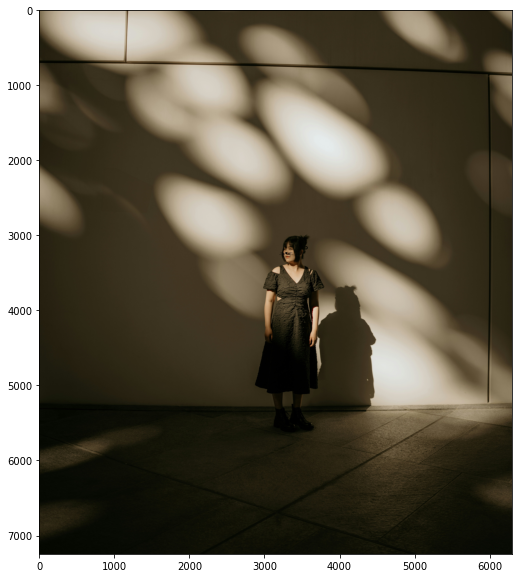

In [26]:
for dlib_rect, landmark in zip(dlib_rects, list_landmarks): # 얼굴 영역을 저장하고 있는 값과 68개의 랜드마크를 저장하고 있는 값으로 반복문 실행
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0] # 이미지에서 코 부위의 x값
    y = landmark[30][1] - dlib_rect.height()//2 # 이미지에서 코 부위의 y값 - 얼굴 영역의 세로를 차지하는 픽셀의 수//
    w = h = dlib_rect.width() # 얼굴 영역의 가로를 차지하는 픽셀의 수 (531-345+1) → max(x) - min(x) +1(픽셀의 수 이기 때문에 1을 더해줌 → 픽셀 수는 점 하나로도 1이 됨)
    print (f'(x,y) : ({x},{y})')
    print (f'(w,h) : ({w},{h})')

sticker_path = os.getenv('HOME')+'/aiffel/camera_sticker/images/cat-whiskers.png'  # 고양이 수염 이미지의 경로
img_sticker = cv2.imread(sticker_path, cv2.IMREAD_UNCHANGED)  # 알파 채널을 포함하여 이미지를 읽어옵니다
print(img_sticker.shape)  # 알파 채널을 포함한 고양이 수염 이미지의 차원 확인

# 이미지 크기 조정
img_sticker = cv2.resize(img_sticker, (w, h))
print(img_sticker.shape)

refined_x = x - w // 2
refined_y = y + w // 20

print (f'(x,y) : ({refined_x},{refined_y})')

sticker_area = img_bgr[refined_y:refined_y + img_sticker.shape[0], refined_x:refined_x + img_sticker.shape[1]]

# 알파 채널을 사용해 하얀 배경을 제거하고 투명한 배경을 유지합니다
if img_sticker.shape[2] == 4:  # 알파 채널이 있는 경우
    # 알파 채널을 0~1로 정규화
    alpha_channel = img_sticker[:, :, 3] / 255.0  # 알파 채널
    sticker_area_rgb = img_sticker[:, :, :3]  # RGB 채널
    
    # 하얀색 배경을 찾아서 알파 채널을 0으로 만듬
    white_pixels = np.all(sticker_area_rgb == [255, 255, 255], axis=-1)  # 하얀색 픽셀 찾기
    alpha_channel[white_pixels] = 0  # 하얀색 부분은 투명하게 만듬

    # img_bgr에 스티커를 합성
    for c in range(3):  # 각 채널에 대해
        img_bgr[refined_y:refined_y + img_sticker.shape[0], refined_x:refined_x + img_sticker.shape[1], c] = \
            (alpha_channel * sticker_area_rgb[:, :, c] + (1 - alpha_channel) * sticker_area[:, :, c]).astype(np.uint8)

# 스티커를 적용한 이미지를 보여줍니다.
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))  # RGB만 적용한 원본 이미지에 스티커 이미지를 덧붙인 결과를 보여줌
plt.show()

멀리있는 사진으로 스티커를 합성해봤을 때는 얼굴에 제대로 합성된 것 같지 않다.

얼굴 인식은 제대로 된 듯하지만 스티커가 얼굴에 적절하게 나오지 않는다고 느껴진다.

스티커가 제대로 보일 만큼의 거리가 필요하거나 스티커 크기 조절이 필요할 듯 싶다.

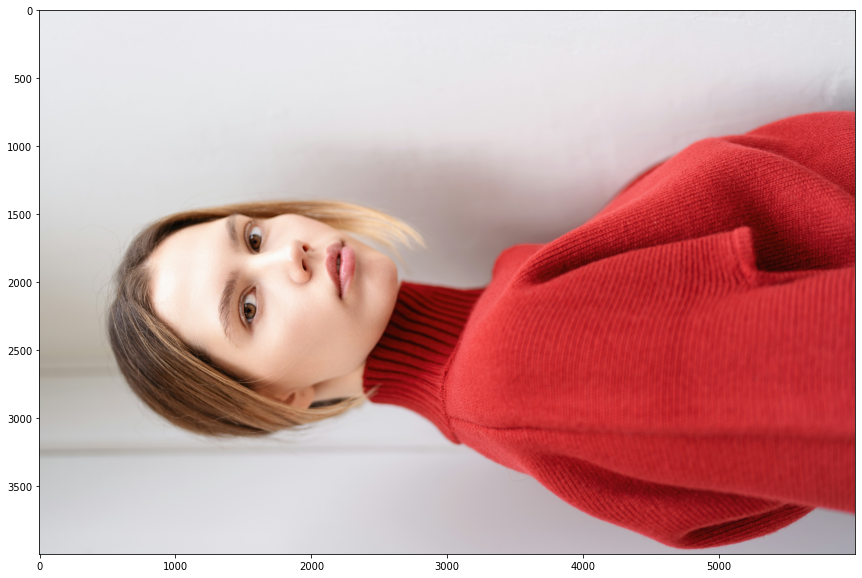

In [27]:
my_image_path = 'images/img_gc_usd.png' # 본인 이미지가 있는 경로를 가지고 온다.
img_bgr = cv2.imread(my_image_path)    # OpenCV로 이미지를 불러옵니다
img_show = img_bgr.copy()      # 출력용 이미지를 따로 보관합니다
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,10))
plt.imshow(img_rgb) # 이미지 실제 출력하기 위해 이미지를 올려줌 (원하는 사이즈의 픽셀을 원하는 색으로 채워서 만든 그림이라고 합니다.)
plt.show() # 이미지 실제 출력

rectangles[[(1491, 1595) (1646, 1750)], [(2924, 2751) (2999, 2825)]]


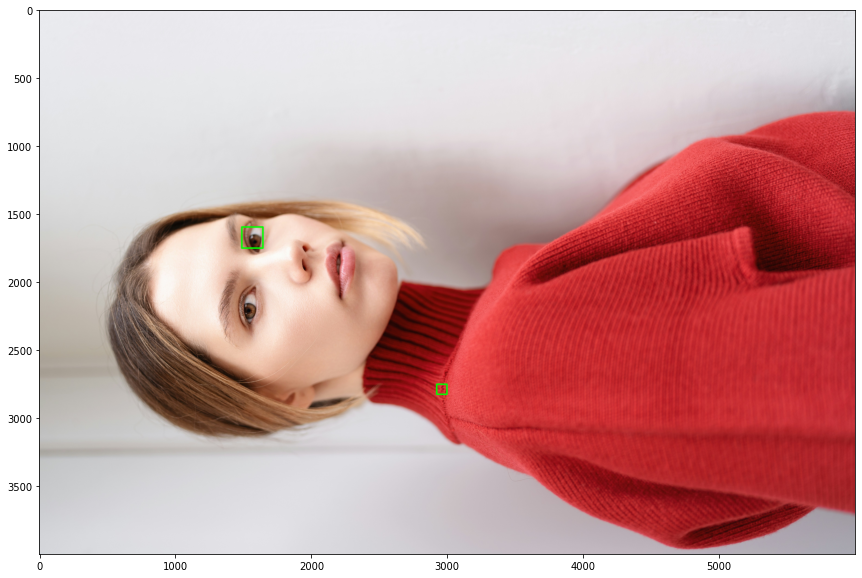

In [28]:
detector_hog = dlib.get_frontal_face_detector() # 기본 얼굴 감지기를 반환

img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)  

print(dlib_rects)

for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽

    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 10, lineType=cv2.LINE_AA) # 시작점의 좌표와 종료점 좌표로 직각 사각형을 그림

img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,10))
plt.imshow(img_show_rgb)
plt.show()

옆으로 누워진 사진은 얼굴이 제대로 감지되지 않는다.

물론 좌, 우, 뒤집은 사진 모두 감지되지 않을 것이다.

### 3. 실행 속도
Snow 어플과 같이 실시간으로 필터 및 스티커를 적용하기 위해서는 실행 속도가 중요할 듯하다.

대체로 실습에 주어진 것과 같은 낮은 해상도의 사진은 실시간으로 가능한 것까지는 아니라도 오랜 시간이 걸리지 않는다.

하지만 이번 프로젝트에 사용한 사진은 고해상도 사진이기에 처음부터 스티커를 합성하는 것까지 1분 이상의 시간이 소모됐다.


### 4. 스티커앱 정확도

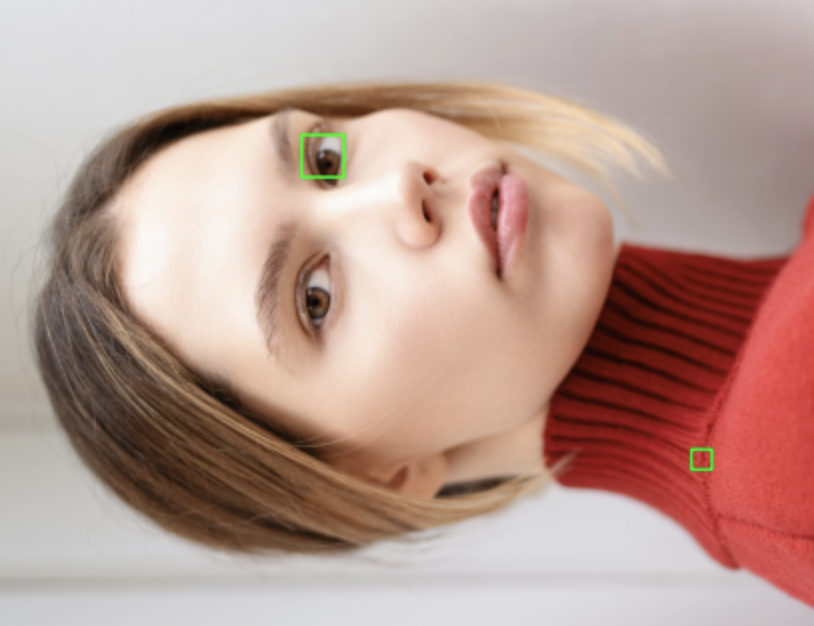

In [40]:
from IPython.display import Image 
Image(filename=os.getcwd()+'/images/img_5.png')

해당 사진에서 볼 수 있듯이 사람 얼굴을 인식하는 바운딩 박스가 잘못 인식하는 경우가 왕왕 있는 것을 확인할 수 있었다.

특히 복잡한 패턴이나 텍스쳐가 있는 부분에서 바운딩 박스가 생기기 쉬운 것 같다.